In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Heart Disease.csv')

In [3]:
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


In [4]:
df.shape

(319795, 18)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [6]:
df.isnull().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

In [7]:
df.duplicated().sum()

18078

<AxesSubplot:>

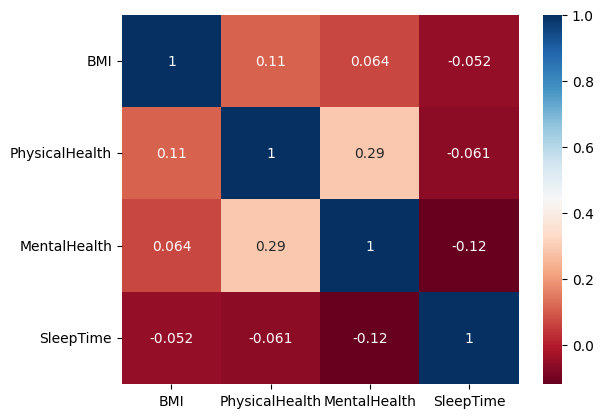

In [8]:
sns.heatmap(df.corr(),cmap='RdBu',annot=True)

<AxesSubplot:xlabel='Smoking', ylabel='count'>

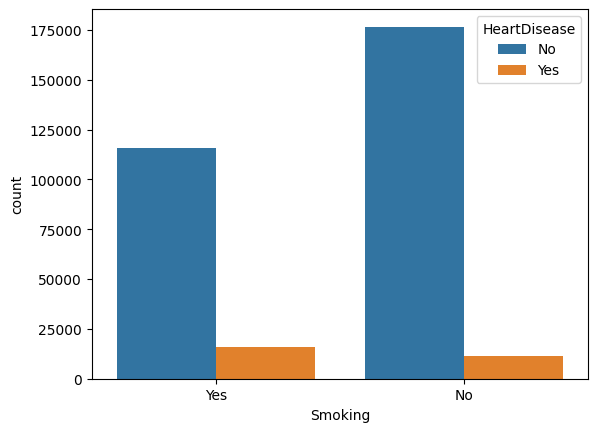

In [9]:
#sns.countplot(df.HeartDisease)
sns.countplot(x='Smoking',hue='HeartDisease',data=df)

NB: The dataset is imbalanced

In [10]:
data=df[df['HeartDisease']=='Yes']
data

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
5,Yes,28.87,Yes,No,No,6.0,0.0,Yes,Female,75-79,Black,No,No,Fair,12.0,No,No,No
10,Yes,34.30,Yes,No,No,30.0,0.0,Yes,Male,60-64,White,Yes,No,Poor,15.0,Yes,No,No
35,Yes,32.98,Yes,No,Yes,10.0,0.0,Yes,Male,75-79,White,Yes,Yes,Poor,4.0,No,No,Yes
42,Yes,25.06,No,No,No,0.0,0.0,Yes,Female,80 or older,White,Yes,No,Good,7.0,No,No,Yes
43,Yes,30.23,Yes,No,No,6.0,2.0,Yes,Female,75-79,White,Yes,Yes,Fair,8.0,No,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319765,Yes,38.45,No,No,Yes,30.0,15.0,Yes,Female,55-59,Hispanic,Yes,Yes,Poor,6.0,Yes,No,No
319767,Yes,36.21,Yes,No,No,0.0,0.0,Yes,Female,75-79,Hispanic,Yes,Yes,Good,8.0,No,No,No
319781,Yes,37.12,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,7.0,No,No,No
319786,Yes,33.20,Yes,No,No,0.0,0.0,No,Female,60-64,Hispanic,Yes,Yes,Very good,8.0,Yes,No,No


In [11]:
smoke=data['Smoking'].value_counts()
smoke

Yes    16037
No     11336
Name: Smoking, dtype: int64

In [12]:
labels=["No",'Yes']

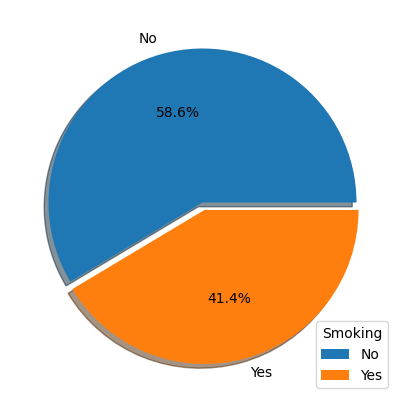

In [13]:
plt.figure(figsize=(5,5))
plt.pie(smoke,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
#circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
#plt.gca().add_artist(circle)
plt.legend(title='Smoking',loc='lower right')
plt.show()

In [14]:
def  bar_chart(feature):
    live=df[df['HeartDisease']=='No'][feature].value_counts()
    die=df[df['HeartDisease']=='Yes'][feature].value_counts()
    df1=pd.DataFrame([live,die])
    df1.index=['Live','Die']
    df1.plot(kind='bar',stacked=True,figsize=(10,5))

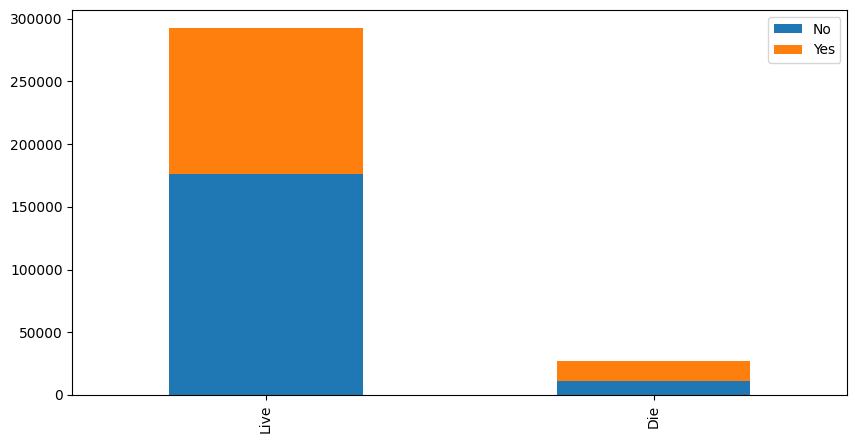

In [15]:
bar_chart('Smoking')

<AxesSubplot:xlabel='BMI', ylabel='Density'>

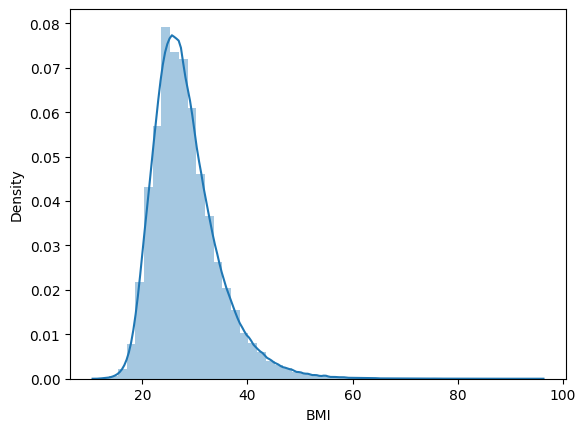

In [16]:
sns.distplot(df['BMI'])

<AxesSubplot:xlabel='BMI', ylabel='Density'>

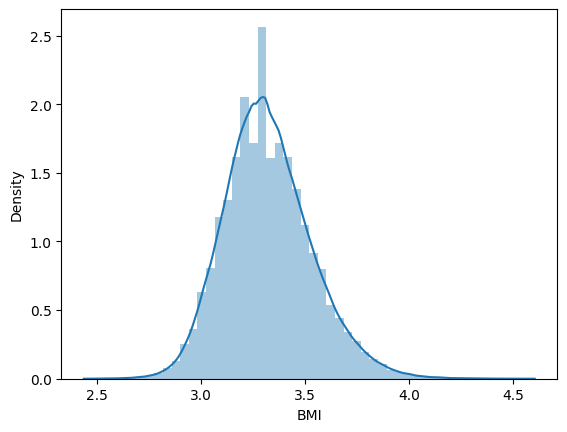

In [17]:
sns.distplot(np.log(df['BMI']))

In [18]:
def kde(x):
    facet=sns.FacetGrid(df,hue="HeartDisease",aspect=4)
    facet.map(sns.kdeplot,x,shade=True)
    facet.set(xlim=(df[x].min(),df[x].max()))
    facet.add_legend()
    plt.show()

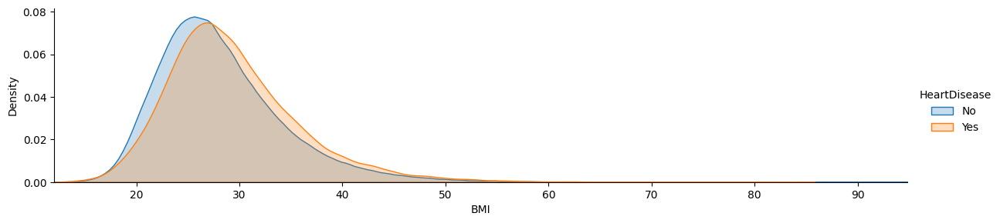

In [19]:
kde('BMI')

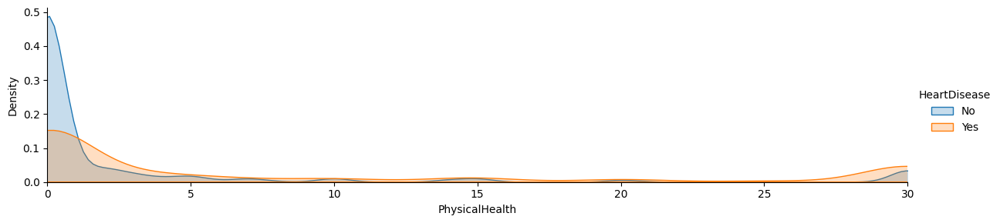

In [20]:
kde('PhysicalHealth')

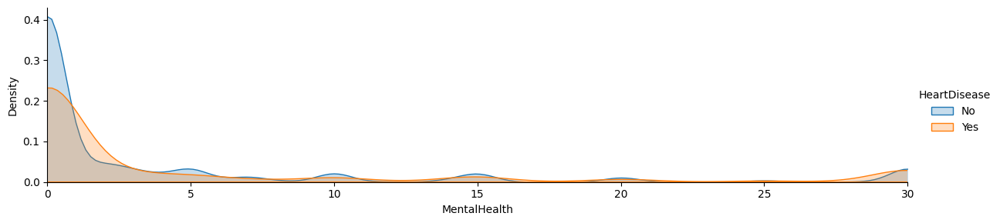

In [21]:
kde('MentalHealth')

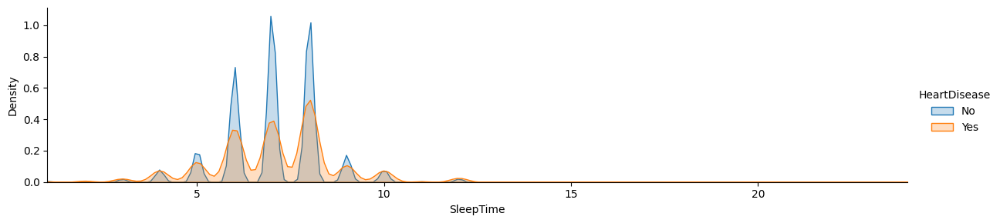

In [22]:
kde('SleepTime')

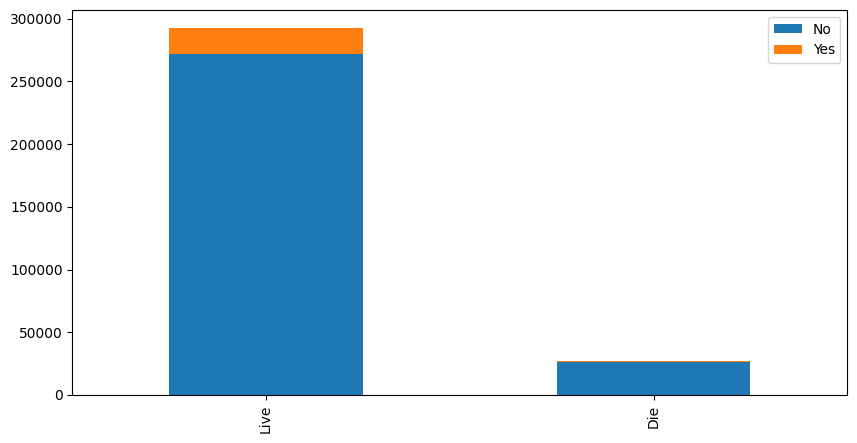

In [23]:
bar_chart('AlcoholDrinking')

In [24]:
AlcoholDrinking=data['AlcoholDrinking'].value_counts()
AlcoholDrinking

No     26232
Yes     1141
Name: AlcoholDrinking, dtype: int64

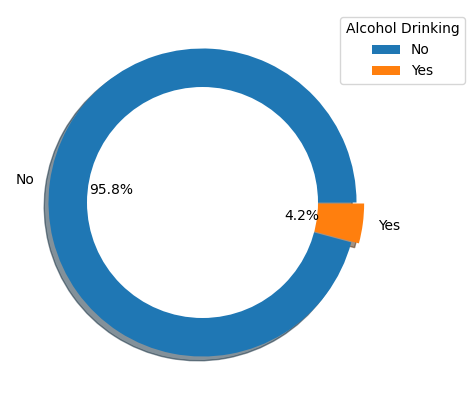

In [25]:
plt.figure(figsize=(5,5))
plt.pie(AlcoholDrinking,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Alcohol Drinking',loc='upper right',bbox_to_anchor=(1.2,1))
plt.show()

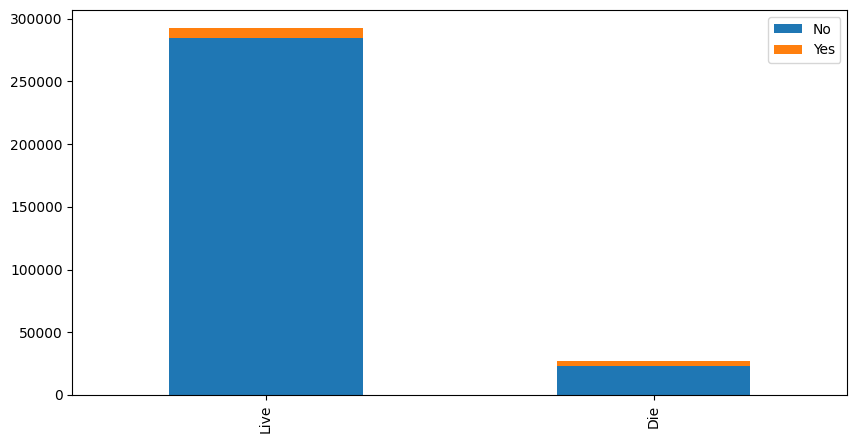

In [26]:
bar_chart('Stroke')

In [27]:
Stroke=data['Stroke'].value_counts()
Stroke

No     22984
Yes     4389
Name: Stroke, dtype: int64

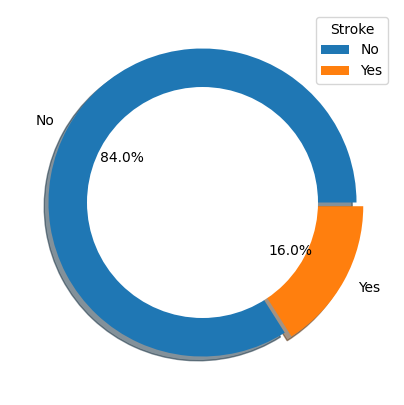

In [28]:
plt.figure(figsize=(5,5))
plt.pie(Stroke,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Stroke',loc='upper right')
plt.show()

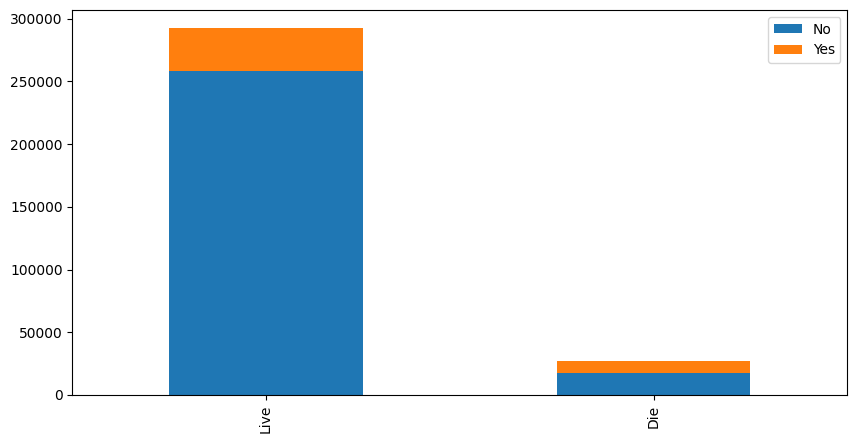

In [29]:
bar_chart('DiffWalking')

In [30]:
DiffWalking=data['DiffWalking'].value_counts()

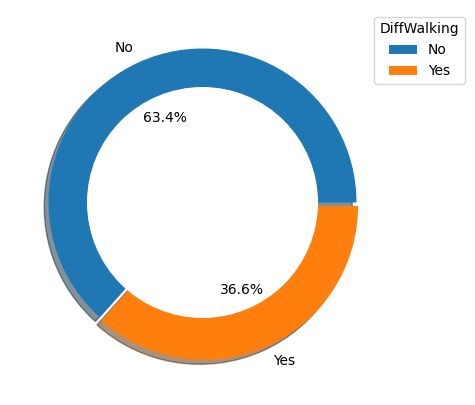

In [31]:
plt.figure(figsize=(5,5))
plt.pie(DiffWalking,labels=labels,explode=[0,0.025] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='DiffWalking',loc='upper right',bbox_to_anchor=(1.2,1))
plt.show()

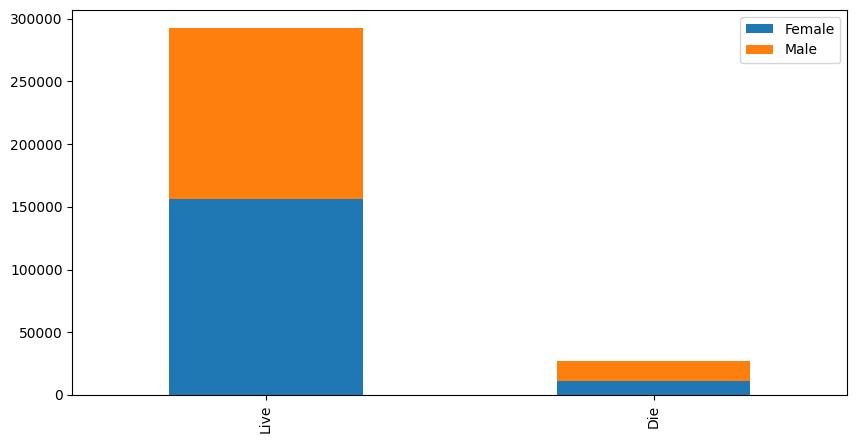

In [32]:
bar_chart('Sex')

In [33]:
Sex=df['Sex'].value_counts()
Sex

Female    167805
Male      151990
Name: Sex, dtype: int64

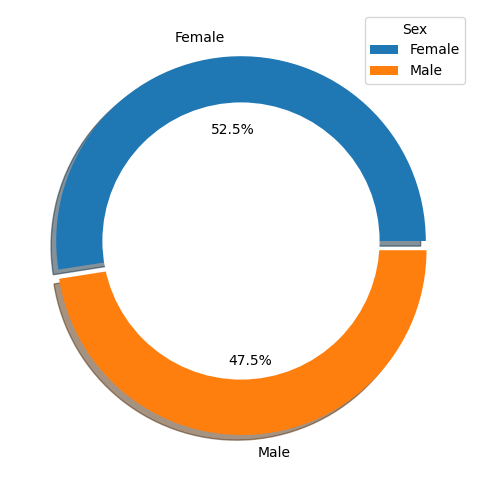

In [34]:
labels=['Female','Male']
plt.figure(figsize=(6,6))
plt.pie(Sex,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Sex',loc='upper right')
plt.show()

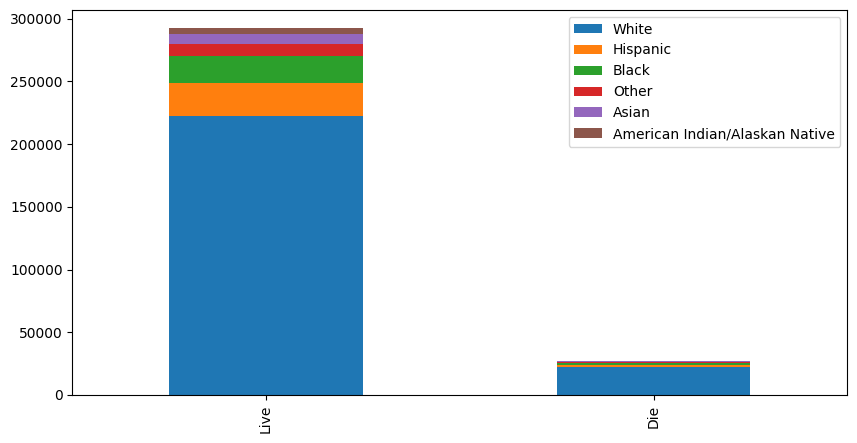

In [35]:
bar_chart('Race')

In [36]:
Race=df['Race'].value_counts()
Race

White                             245212
Hispanic                           27446
Black                              22939
Other                              10928
Asian                               8068
American Indian/Alaskan Native      5202
Name: Race, dtype: int64

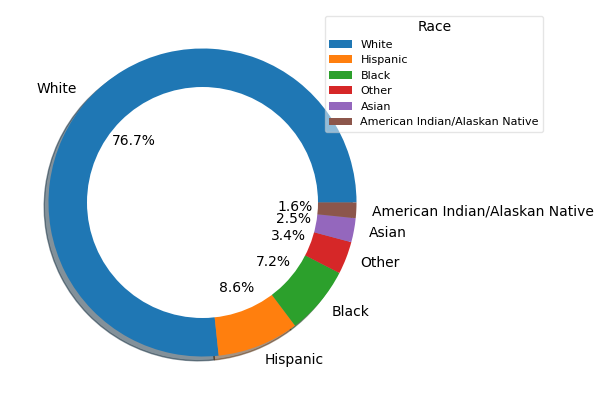

In [37]:
labels=['White','Hispanic','Black','Other','Asian','American Indian/Alaskan Native']
plt.figure(figsize=(5,5))
plt.pie(Race,labels=labels,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Race',loc='upper right',framealpha=0.5,fontsize=8,bbox_to_anchor=(1.4,1))
plt.show()

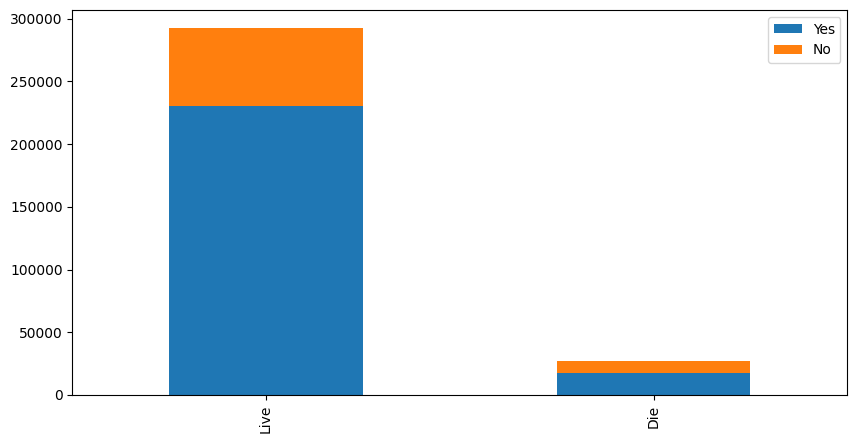

In [38]:
bar_chart('PhysicalActivity')

In [39]:
PhysicalActivity=df['PhysicalActivity'].value_counts()
PhysicalActivity

Yes    247957
No      71838
Name: PhysicalActivity, dtype: int64

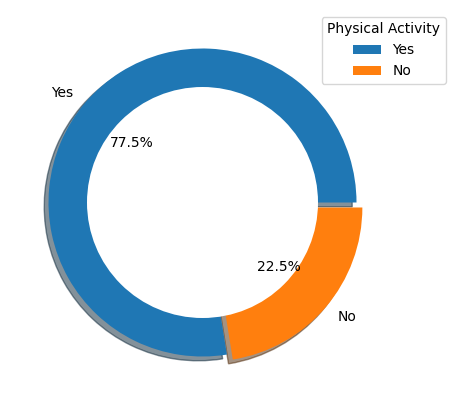

In [40]:
labels=['Yes','No']
plt.figure(figsize=(5,5))
plt.pie(PhysicalActivity,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Physical Activity',loc='upper right',bbox_to_anchor=(1.15,1))
plt.show()

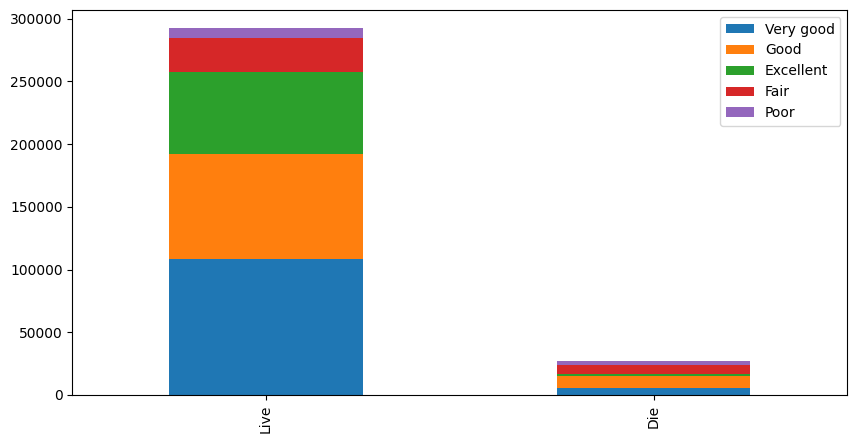

In [41]:
bar_chart('GenHealth')

In [42]:
GenHealth=data['GenHealth'].value_counts()
GenHealth

Good         9558
Fair         7084
Very good    5381
Poor         3850
Excellent    1500
Name: GenHealth, dtype: int64

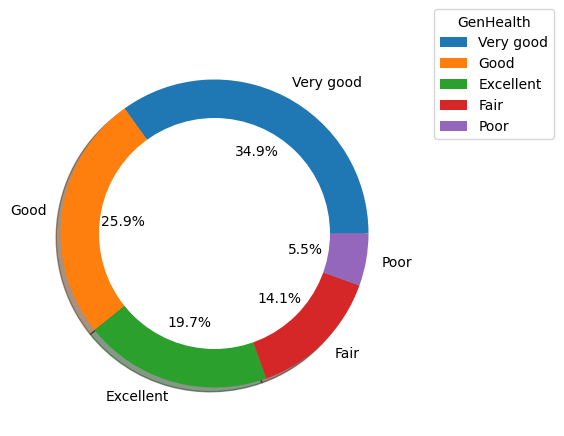

In [43]:
labels=['Very good','Good','Excellent','Fair','Poor']
plt.figure(figsize=(5,5))
plt.pie(GenHealth,labels=labels,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='GenHealth',loc='upper right',bbox_to_anchor=(1.4,1.1))
plt.show()

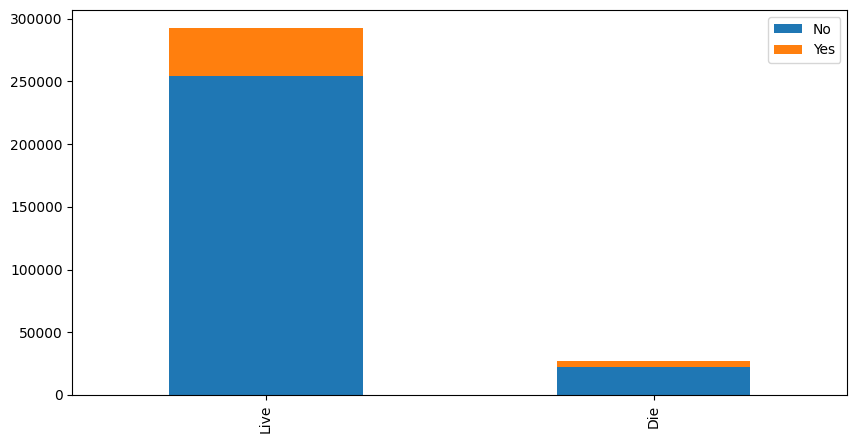

In [44]:
bar_chart('Asthma')

In [45]:
Asthma=data['Asthma'].value_counts()
Asthma

No     22440
Yes     4933
Name: Asthma, dtype: int64

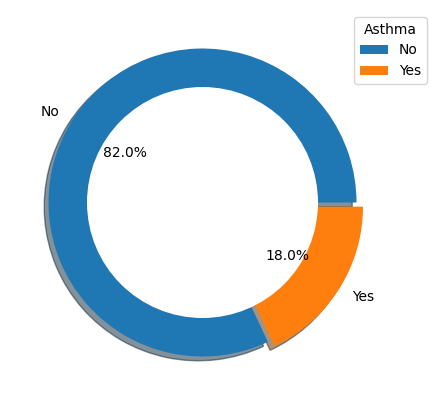

In [46]:
labels=['No','Yes']
plt.figure(figsize=(5,5))
plt.pie(Asthma,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Asthma',loc='upper right',bbox_to_anchor=(1.1,1))
plt.show()

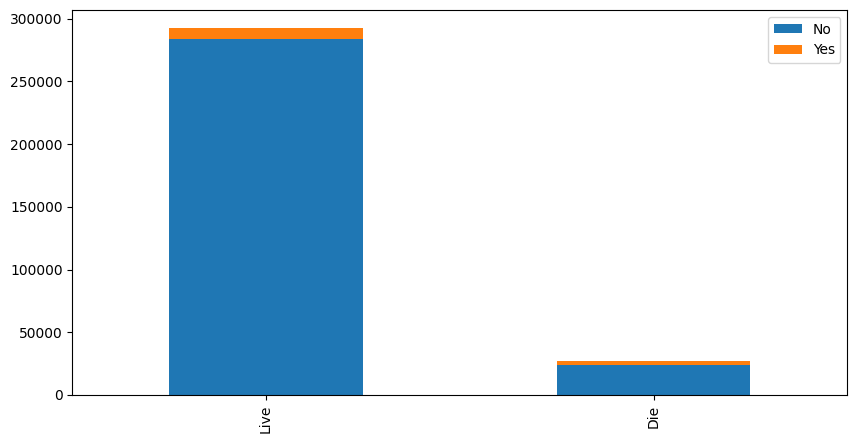

In [47]:
bar_chart('KidneyDisease')

In [48]:
KidneyDisease=data['KidneyDisease'].value_counts()
KidneyDisease

No     23918
Yes     3455
Name: KidneyDisease, dtype: int64

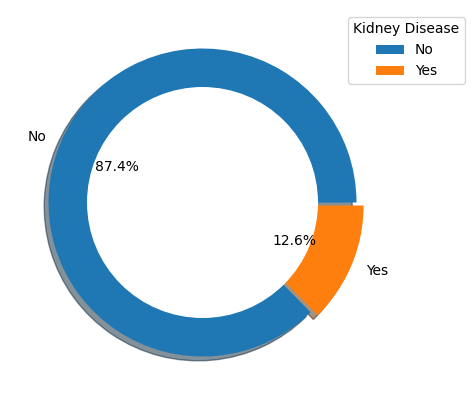

In [49]:
plt.figure(figsize=(5,5))
plt.pie(KidneyDisease,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Kidney Disease',loc='upper right',bbox_to_anchor=(1.2,1))
plt.show()

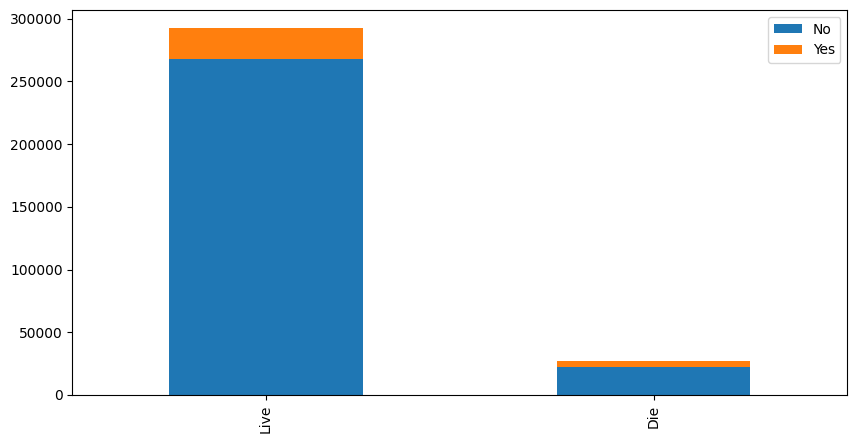

In [50]:
bar_chart('SkinCancer')

In [51]:
SkinCancer=data['SkinCancer'].value_counts()
SkinCancer

No     22393
Yes     4980
Name: SkinCancer, dtype: int64

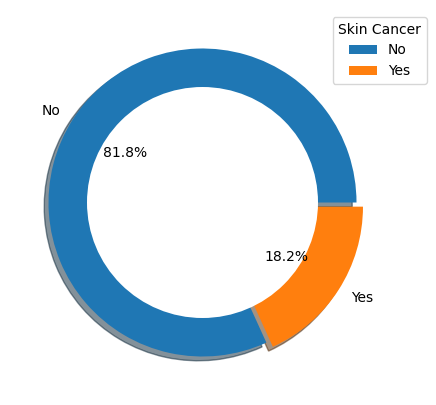

In [52]:
plt.figure(figsize=(5,5))
plt.pie(SkinCancer,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Skin Cancer',loc='upper right',bbox_to_anchor=(1.1,1))
plt.show()

NB:

    All of the above pie chart are done for only who has heart disease
    Another graphical representations capture the whole dataset
    As the dataset is imbalanced so the another visualization can not satisfy

<AxesSubplot:>

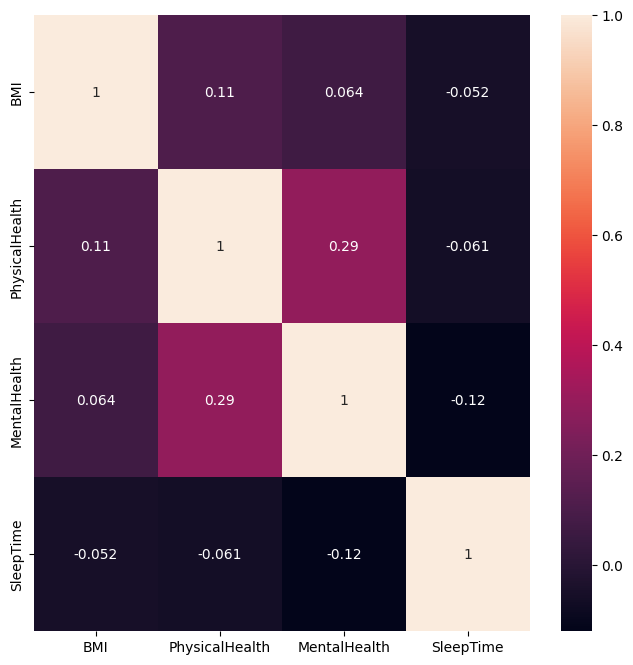

In [53]:
plt.figure(figsize=(8,8))
sns.heatmap(df.corr(),annot=True)

In [54]:
mask=np.zeros_like(df.corr())
triangle_indices=np.tril_indices_from(mask)
mask[triangle_indices]=True
mask

array([[1., 0., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 1., 0.],
       [1., 1., 1., 1.]])

<AxesSubplot:>

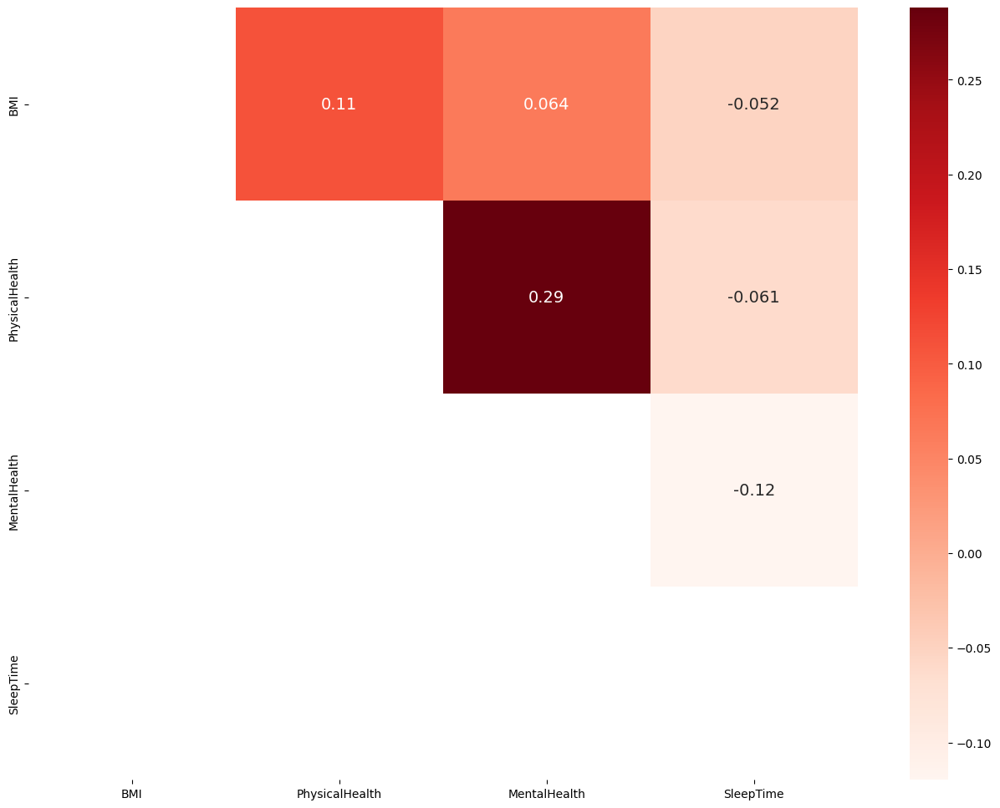

In [55]:
plt.figure(figsize=(16,12))
sns.heatmap(df.corr(),mask=mask,annot=True,annot_kws={'size':14},cmap='Reds')

<AxesSubplot:>

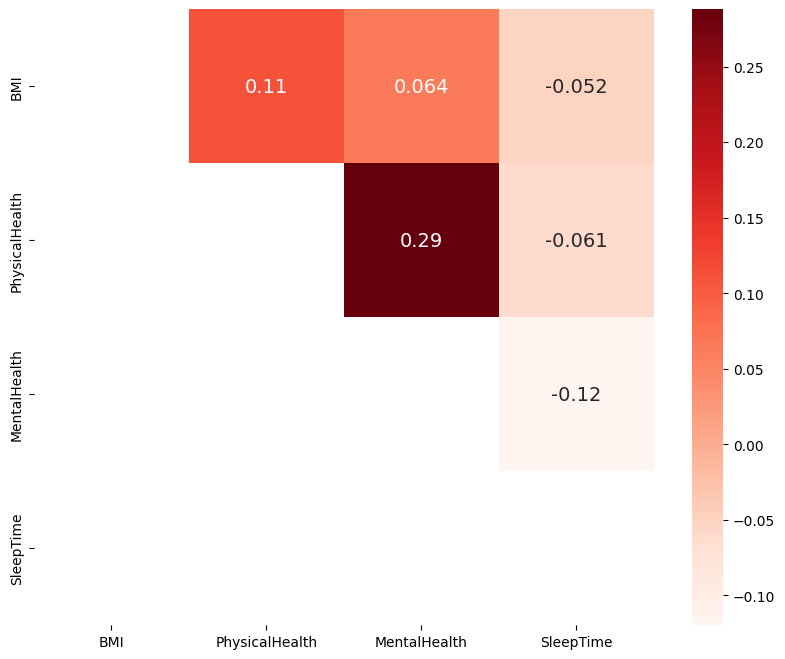

In [56]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(),mask=mask,annot=True,annot_kws={'size':14},cmap='Reds')#cmap=YlGnBu,Blues,Greens

# Data preprocessing for balancing

In [57]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score,mean_absolute_error,accuracy_score

In [58]:
from sklearn.preprocessing import LabelEncoder

In [59]:
le=LabelEncoder()

In [60]:
list=['HeartDisease','Smoking', 'AlcoholDrinking', 'Stroke','DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'Asthma', 'KidneyDisease', 'SkinCancer']
for i in list:
    df[i]=le.fit_transform(df[i])

In [61]:
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,0,7,5,2,1,4,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,0,12,5,0,1,4,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,1,9,5,2,1,1,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,0,11,5,0,0,2,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,0,4,5,0,1,4,8.0,0,0,0


In [62]:
x=df.drop(columns=['HeartDisease'])
y=df['HeartDisease']

In [63]:
x.sample(5)

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
112808,25.33,0,0,0,2.0,2.0,0,1,10,5,0,1,4,7.0,0,0,1
131024,25.84,0,0,0,0.0,0.0,0,0,9,5,1,1,4,7.0,1,0,1
110445,27.76,0,0,0,7.0,0.0,0,1,4,5,0,1,4,7.0,0,1,0
3969,31.00,0,0,0,2.0,0.0,0,0,1,5,0,1,4,8.0,0,0,0
190874,28.29,0,1,0,2.0,0.0,0,0,2,3,0,1,4,7.0,0,0,0


# Undersampling

In [64]:
from imblearn.under_sampling import NearMiss

In [65]:
NearMiss_obj = NearMiss()
new_x , new_y = NearMiss_obj.fit_resample(x,y)

In [66]:
new_y

0        0
1        0
2        0
3        0
4        0
        ..
54741    1
54742    1
54743    1
54744    1
54745    1
Name: HeartDisease, Length: 54746, dtype: int32

In [67]:
new_y.value_counts()

0    27373
1    27373
Name: HeartDisease, dtype: int64

In [68]:
df2=pd.DataFrame(new_x)
df2.head()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0
1,22.24,1,0,0,0.0,0.0,0,1,11,5,0,1,4,7.0,0,0,0
2,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0
3,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0
4,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0


In [69]:
df3=pd.DataFrame(new_y)
df3.head()

,HeartDisease
0,0
1,0
2,0
3,0
4,0


In [70]:
df4=pd.concat([df2,df3],axis=1)
df4

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
0,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0,0
1,22.24,1,0,0,0.0,0.0,0,1,11,5,0,1,4,7.0,0,0,0,0
2,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0,0
3,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0,0
4,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54741,38.45,0,0,1,30.0,15.0,1,0,7,3,2,1,3,6.0,1,0,0,1
54742,36.21,1,0,0,0.0,0.0,1,0,11,3,2,1,2,8.0,0,0,0,1
54743,37.12,1,0,0,0.0,0.0,0,1,3,3,0,1,4,7.0,0,0,0,1
54744,33.20,1,0,0,0.0,0.0,0,0,8,3,2,1,4,8.0,1,0,0,1


# Feature ranking

In [71]:
df4.nunique()

BMI                 2267
Smoking                2
AlcoholDrinking        2
Stroke                 2
PhysicalHealth        31
MentalHealth          31
DiffWalking            2
Sex                    2
AgeCategory           13
Race                   6
Diabetic               4
PhysicalActivity       2
GenHealth              5
SleepTime             22
Asthma                 2
KidneyDisease          2
SkinCancer             2
HeartDisease           2
dtype: int64

In [72]:
from sklearn.ensemble import ExtraTreesClassifier # Decison tree

In [73]:
extr = ExtraTreesClassifier()

In [74]:
extr.fit(new_x,new_y)

ExtraTreesClassifier()

In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.
On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.

In [75]:
extr.feature_importances_ # IG from decision tree

array([0.2413628 , 0.00908728, 0.00721973, 0.04128073, 0.13033457,
       0.08190636, 0.10963052, 0.00624076, 0.03498486, 0.04495549,
       0.06199855, 0.06391656, 0.05491454, 0.03755286, 0.0379645 ,
       0.02542072, 0.01122919])

In [76]:
feature_importance = extr.feature_importances_
feature_importance #info gain

array([0.2413628 , 0.00908728, 0.00721973, 0.04128073, 0.13033457,
       0.08190636, 0.10963052, 0.00624076, 0.03498486, 0.04495549,
       0.06199855, 0.06391656, 0.05491454, 0.03755286, 0.0379645 ,
       0.02542072, 0.01122919])

In [77]:
imp = pd.DataFrame(feature_importance, columns=['Gain_Score'])
imp.head(10)

,Gain_Score
0,0.241363
1,0.009087
2,0.007220
3,0.041281
4,0.130335
5,0.081906
6,0.109631
7,0.006241
8,0.034985
9,0.044955


In [78]:
new_x.columns

Index(['BMI', 'Smoking', 'AlcoholDrinking', 'Stroke', 'PhysicalHealth',
       'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory', 'Race', 'Diabetic',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       'SkinCancer'],
      dtype='object')

In [79]:
cols = pd.DataFrame(new_x.columns, columns=['Feature_Names'])
cols.head(10)

,Feature_Names
0,BMI
1,Smoking
2,AlcoholDrinking
3,Stroke
4,PhysicalHealth
5,MentalHealth
6,DiffWalking
7,Sex
8,AgeCategory
9,Race


In [80]:
gains = pd.concat([cols,imp],axis=1)
gains

,Feature_Names,Gain_Score
0,BMI,0.241363
1,Smoking,0.009087
2,AlcoholDrinking,0.007220
3,Stroke,0.041281
4,PhysicalHealth,0.130335
5,MentalHealth,0.081906
6,DiffWalking,0.109631
7,Sex,0.006241
8,AgeCategory,0.034985
9,Race,0.044955


In [81]:
newx = gains.nlargest(18,'Gain_Score')
newx

,Feature_Names,Gain_Score
0,BMI,0.241363
4,PhysicalHealth,0.130335
6,DiffWalking,0.109631
5,MentalHealth,0.081906
11,PhysicalActivity,0.063917
10,Diabetic,0.061999
12,GenHealth,0.054915
9,Race,0.044955
3,Stroke,0.041281
14,Asthma,0.037964


<AxesSubplot:xlabel='Gain_Score', ylabel='Feature_Names'>

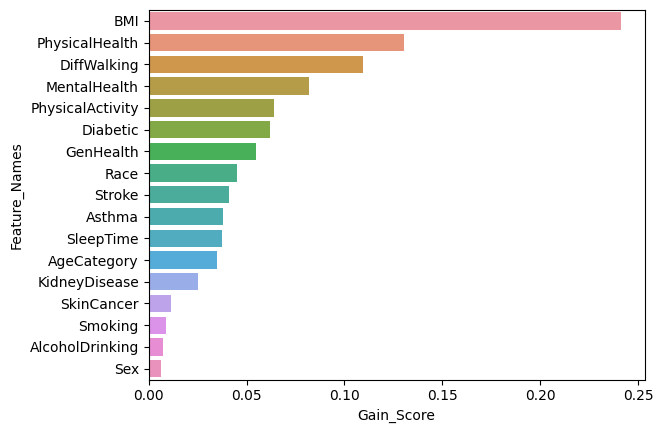

In [82]:
sns.barplot(x='Gain_Score',y='Feature_Names',data=newx)

<AxesSubplot:>

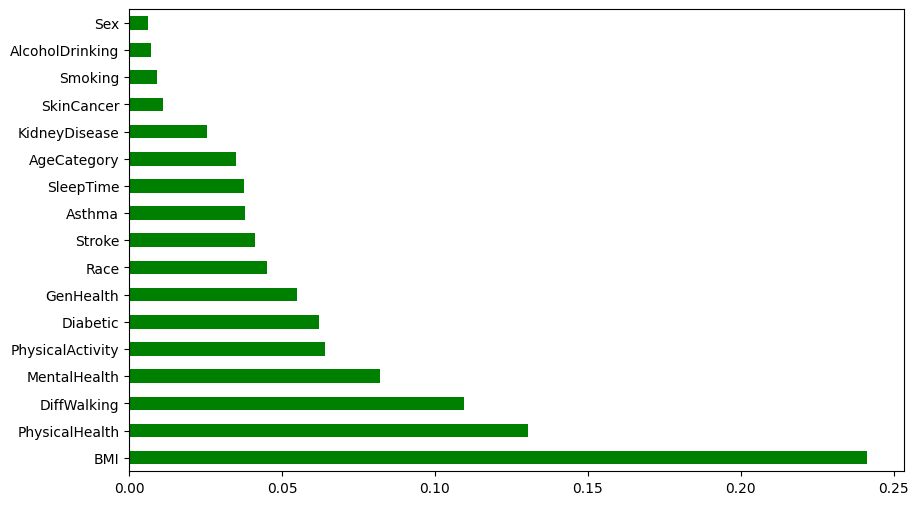

In [83]:
features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='barh', color='g')
#plt.savefig('score1.png')

In [84]:
from sklearn.feature_selection import SelectKBest, f_classif, chi2, f_regression #chi2 only when features are non negative

In [85]:
model2 = SelectKBest(score_func=f_classif)

In [86]:
feature_score = model2.fit(new_x,new_y)

In [87]:
feature_score.scores_

array([3.75440127e+03, 2.03552236e+03, 6.95297966e+02, 4.83533549e+03,
       1.25312036e+04, 6.96957949e+03, 1.36347702e+04, 2.23507248e+02,
       2.12111452e+00, 4.54938853e+03, 9.24225452e+03, 9.11220252e+03,
       1.44917353e+03, 4.00600240e+02, 4.86418830e+03, 3.66576795e+03,
       9.91111023e+02])

In [88]:
cols = pd.DataFrame(feature_score.scores_ , columns=['Feature_Scores'])
cols

,Feature_Scores
0,3754.401268
1,2035.522364
2,695.297966
3,4835.335493
4,12531.203572
5,6969.579494
6,13634.770216
7,223.507248
8,2.121115
9,4549.388533


In [89]:
col2 = pd.DataFrame(new_x.columns, columns=['Feature_Names'])
col2.head()

,Feature_Names
0,BMI
1,Smoking
2,AlcoholDrinking
3,Stroke
4,PhysicalHealth


In [90]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,BMI,3754.401268
1,Smoking,2035.522364
2,AlcoholDrinking,695.297966
3,Stroke,4835.335493
4,PhysicalHealth,12531.203572
5,MentalHealth,6969.579494
6,DiffWalking,13634.770216
7,Sex,223.507248
8,AgeCategory,2.121115
9,Race,4549.388533


In [91]:
new = scores.nlargest(18,'Feature_Scores')
new

,Feature_Names,Feature_Scores
6,DiffWalking,13634.770216
4,PhysicalHealth,12531.203572
10,Diabetic,9242.254520
11,PhysicalActivity,9112.202523
5,MentalHealth,6969.579494
14,Asthma,4864.188299
3,Stroke,4835.335493
9,Race,4549.388533
0,BMI,3754.401268
15,KidneyDisease,3665.767952


Text(0.5, 1.0, 'Feature ranking using SelectKBest classifier')

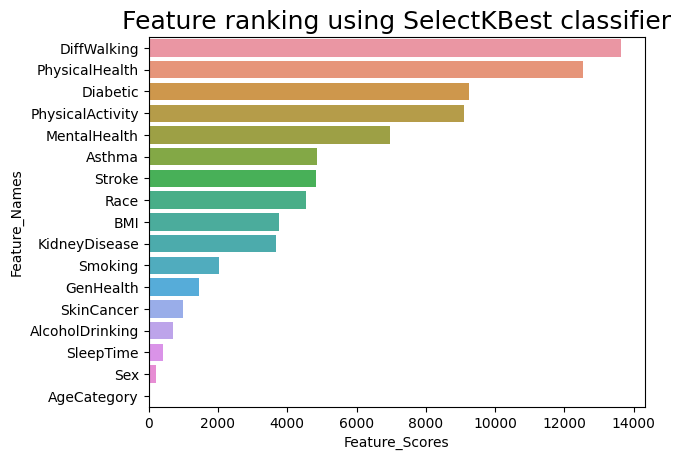

In [92]:
sns.barplot(x='Feature_Scores',y='Feature_Names',data=new)
plt.title('Feature ranking using SelectKBest classifier',fontsize=18)

Text(0.5, 1.0, 'Feature ranking using Extra tree classifier')

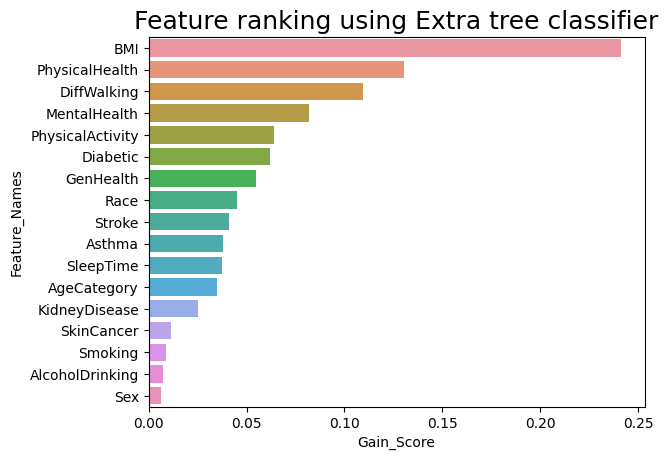

In [93]:
sns.barplot(x='Gain_Score',y='Feature_Names',data=newx)
plt.title('Feature ranking using Extra tree classifier',fontsize=18)

# PCA

In [94]:
df.info

<bound method DataFrame.info of         HeartDisease    BMI  Smoking  AlcoholDrinking  Stroke  PhysicalHealth  \
0                  0  16.60        1                0       0             3.0   
1                  0  20.34        0                0       1             0.0   
2                  0  26.58        1                0       0            20.0   
3                  0  24.21        0                0       0             0.0   
4                  0  23.71        0                0       0            28.0   
...              ...    ...      ...              ...     ...             ...   
319790             1  27.41        1                0       0             7.0   
319791             0  29.84        1                0       0             0.0   
319792             0  24.24        0                0       0             0.0   
319793             0  32.81        0                0       0             0.0   
319794             0  46.56        0                0       0             0.0

In [95]:
#FEATURE SCALING 
from sklearn.preprocessing import MinMaxScaler  #SandardScaler()

In [96]:
mmx = MinMaxScaler() #feature_range=(2,5)

In [97]:
scaled_x = mmx.fit_transform(new_x)

In [98]:
from sklearn.decomposition import PCA

In [99]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)

In [100]:
x_pca

array([[-0.66189843,  0.02120863,  0.29703306],
       [-0.25532252, -0.64984605, -0.31884501],
       [-0.3786803 ,  0.74643735, -0.25379402],
       ...,
       [-0.23142873, -0.65957256, -0.28611674],
       [ 0.30978562,  0.11683819, -0.80249928],
       [ 1.24148259, -0.43433035,  0.48565005]])

In [101]:
features = pd.DataFrame(x_pca, columns=['pca1','pca2','pca3'])

In [102]:
import plotly.express as pl
pl.scatter_3d(features, x='pca1',y='pca2',z='pca3', color='pca1')

# EDA for Balanced Data

<AxesSubplot:xlabel='Smoking', ylabel='count'>

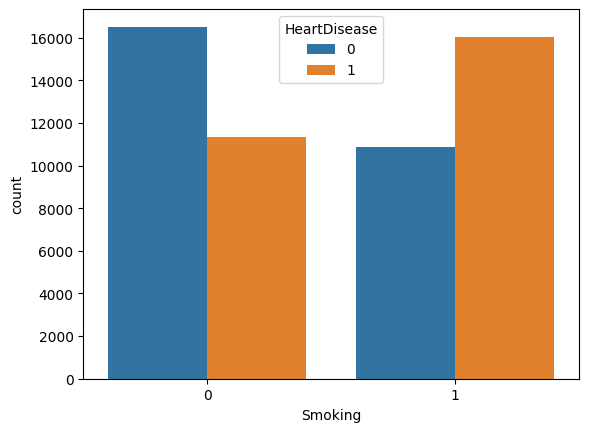

In [103]:
sns.countplot(x='Smoking',hue='HeartDisease',data=df4)

<AxesSubplot:xlabel='Smoking', ylabel='count'>

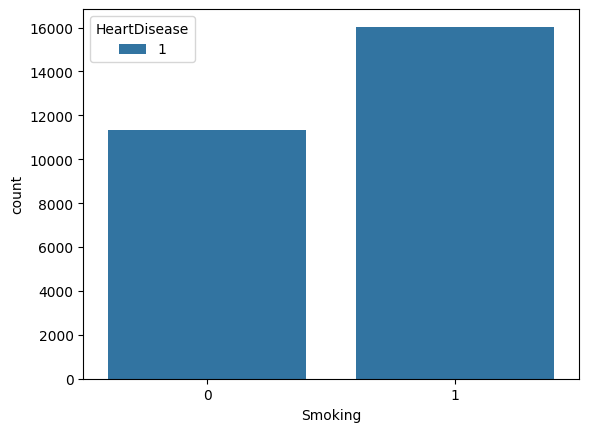

In [104]:
sns.countplot(x='Smoking',hue='HeartDisease',data=df4[df4['HeartDisease']==1])

In [105]:
def count(y):
    sns.countplot(x=y,hue='HeartDisease',data=df4[df4['HeartDisease']==1])

In [106]:
def countpair(y):
    sns.countplot(x=y,hue='HeartDisease',data=df4)

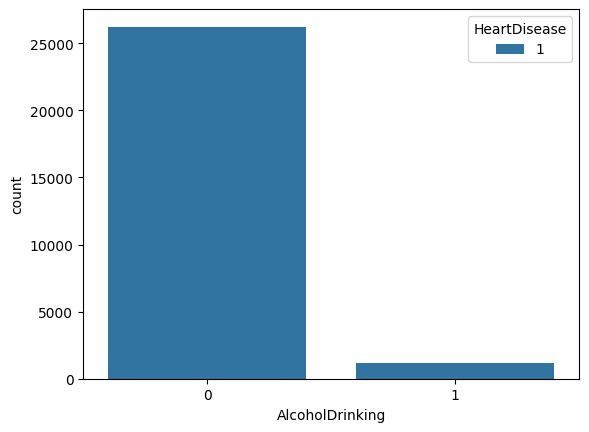

In [107]:
count('AlcoholDrinking')

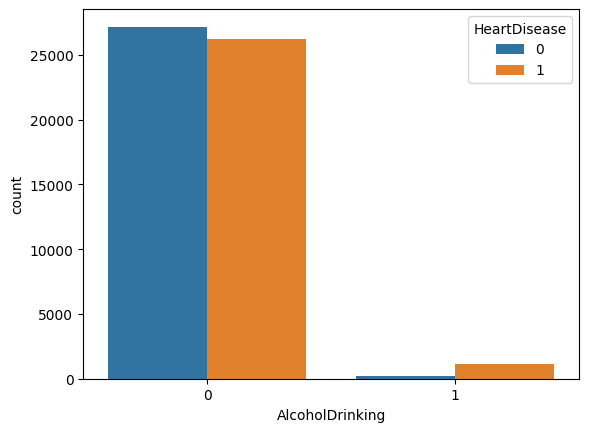

In [108]:
countpair('AlcoholDrinking')

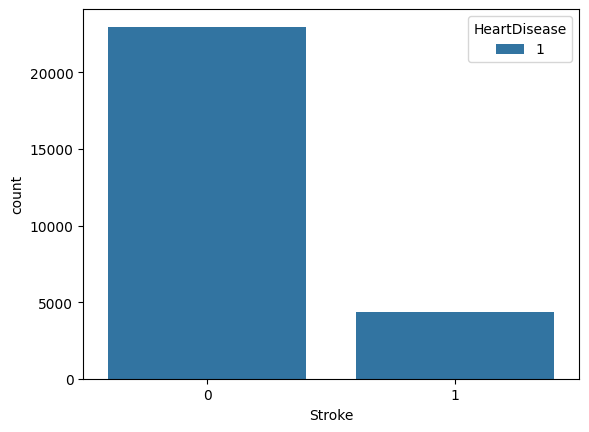

In [109]:
count('Stroke')

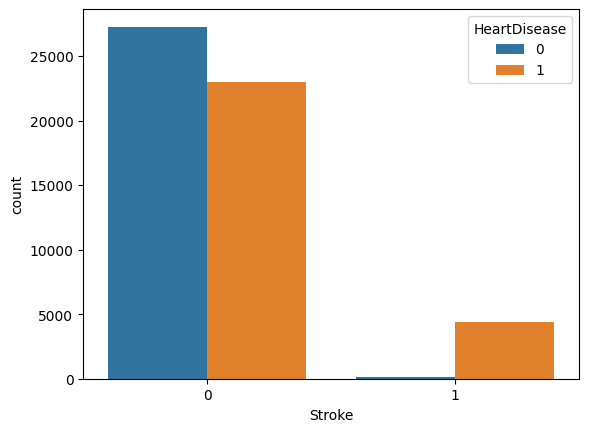

In [110]:
countpair('Stroke')

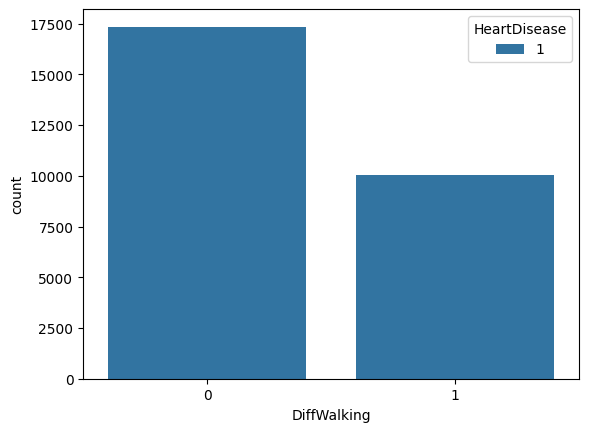

In [111]:
count('DiffWalking')

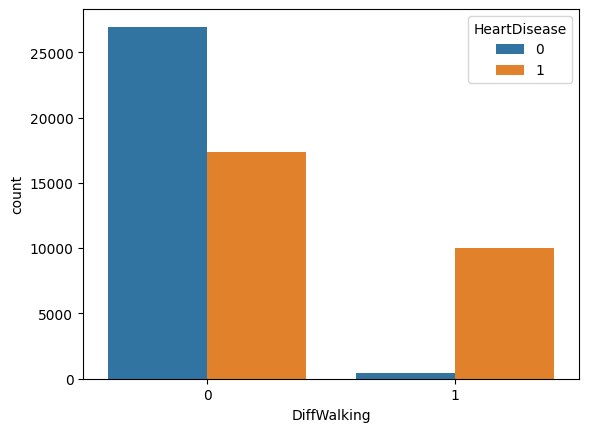

In [112]:
countpair('DiffWalking')

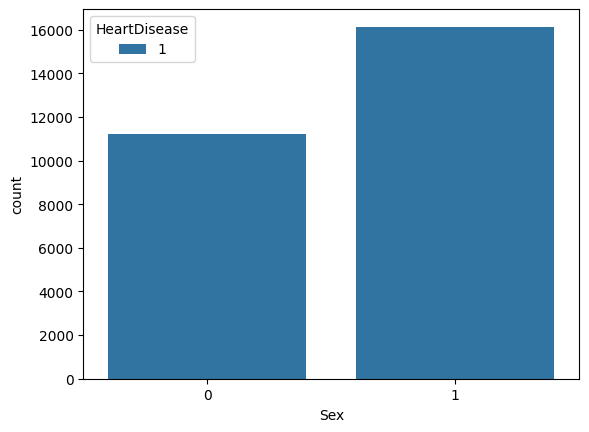

In [113]:
count('Sex')

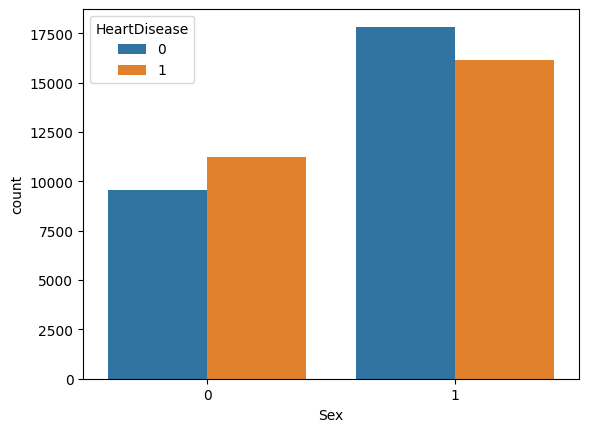

In [114]:
countpair('Sex')

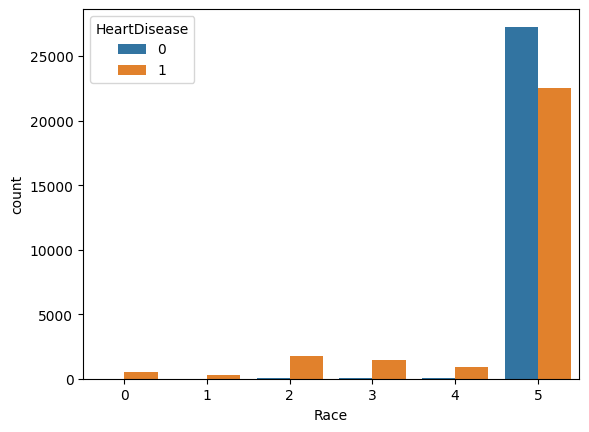

In [115]:
countpair('Race')

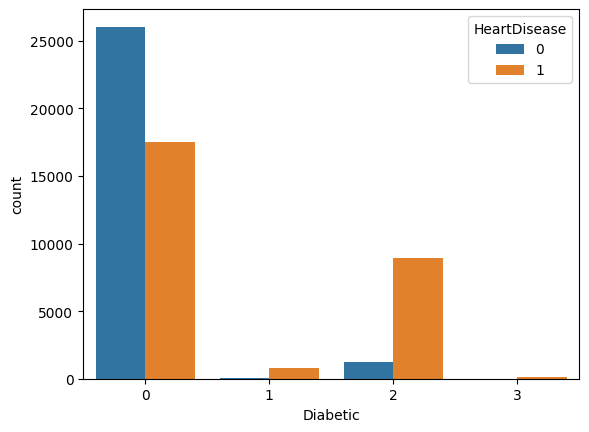

In [116]:
countpair('Diabetic')

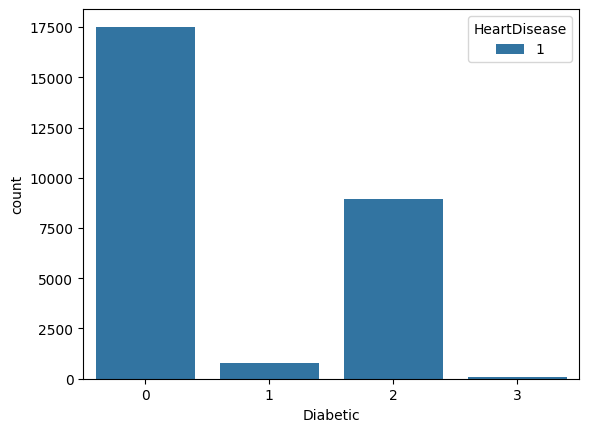

In [117]:
count('Diabetic')

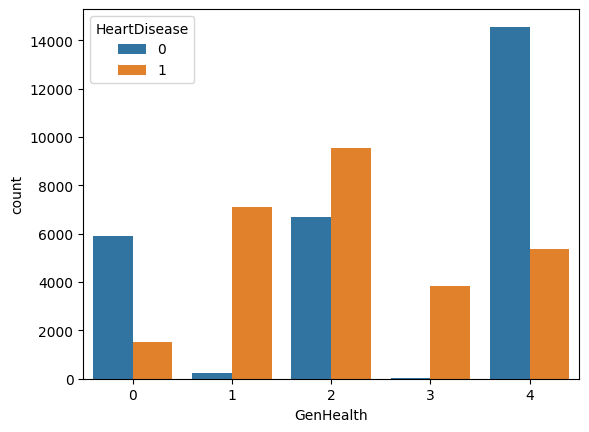

In [118]:
countpair('GenHealth')

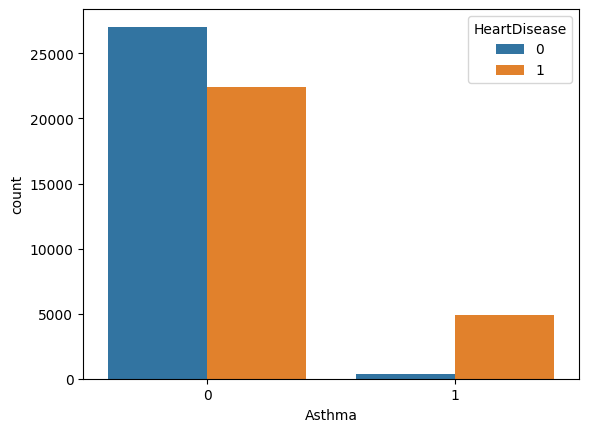

In [119]:
countpair('Asthma')

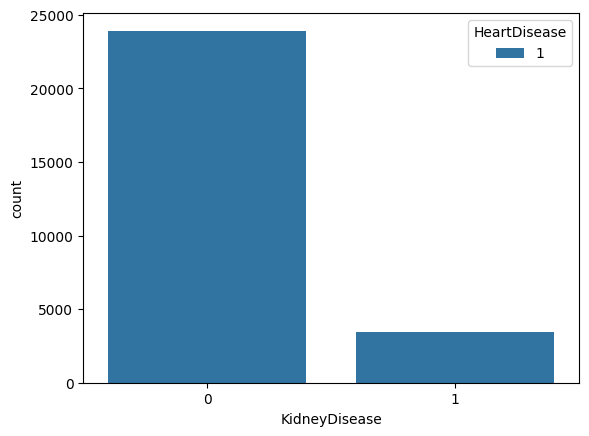

In [120]:
count('KidneyDisease')

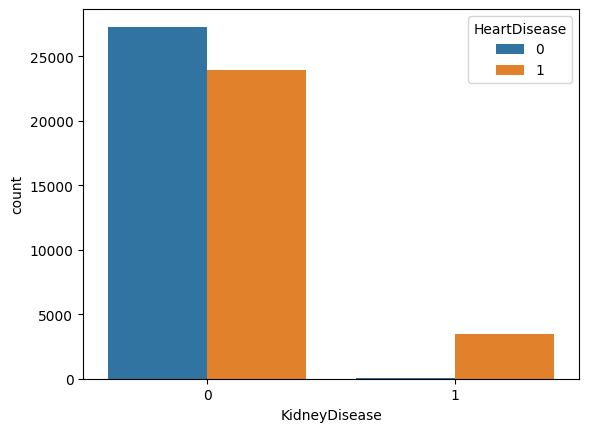

In [121]:
countpair('KidneyDisease')

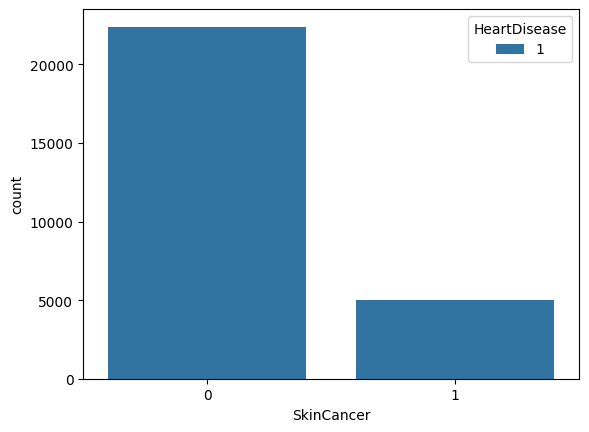

In [122]:
count('SkinCancer')

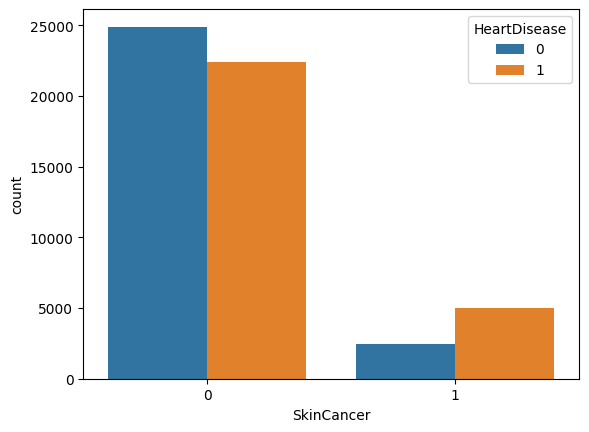

In [123]:
countpair('SkinCancer')

In [124]:
def KDE(x):
    facet=sns.FacetGrid(df4,hue="HeartDisease",aspect=4)
    facet.map(sns.kdeplot,x,shade=True)
    facet.set(xlim=(df4[x].min(),df4[x].max()))
    facet.add_legend()
    plt.show()

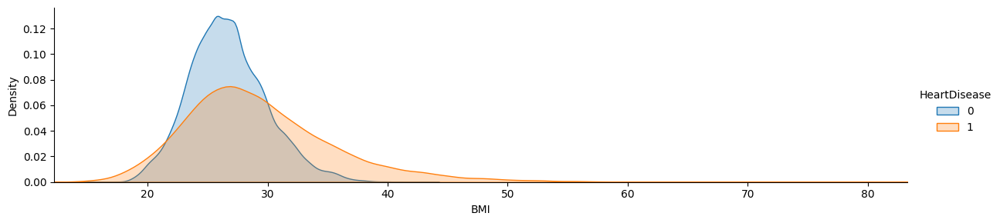

In [125]:
KDE('BMI')

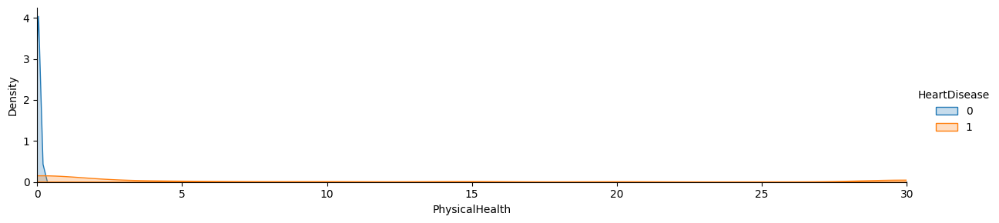

In [126]:
KDE('PhysicalHealth')

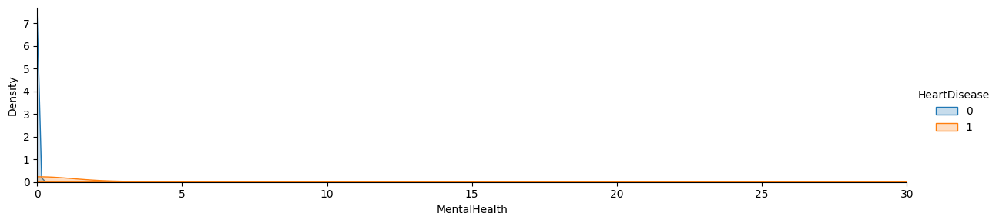

In [127]:
KDE('MentalHealth')

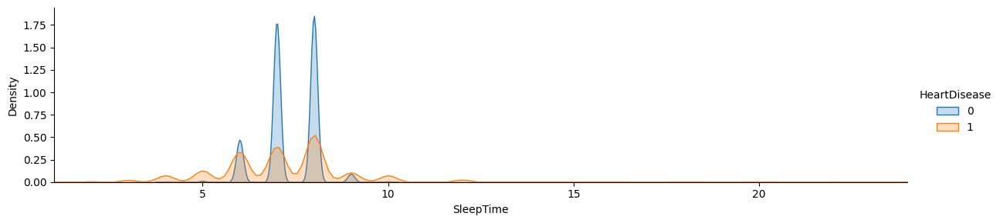

In [128]:
KDE('SleepTime')

In [129]:
df4.corr()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
BMI,1.000000,0.049441,0.014670,0.068767,0.192687,0.145983,0.257873,0.066262,-0.185498,-0.114441,0.293306,-0.210051,-0.031508,-0.067029,0.164275,0.120651,-0.018091,0.253337
Smoking,0.049441,1.000000,0.092053,0.076455,0.133507,0.112300,0.128243,0.101611,0.005786,-0.028858,0.099076,-0.128546,-0.014393,-0.025905,0.067483,0.042515,0.026792,0.189340
AlcoholDrinking,0.014670,0.092053,1.000000,0.024267,0.039746,0.072052,0.026511,0.008041,-0.059917,-0.012962,-0.007564,-0.042995,-0.000983,-0.002374,0.024382,0.000318,0.009680,0.111989
Stroke,0.068767,0.076455,0.024267,1.000000,0.236168,0.171132,0.256971,-0.045099,0.015393,-0.140675,0.169159,-0.172935,-0.067838,-0.018876,0.132583,0.137583,0.043969,0.284882
PhysicalHealth,0.192687,0.133507,0.039746,0.236168,1.000000,0.440993,0.520376,-0.089319,-0.039676,-0.149459,0.264498,-0.365403,-0.082941,-0.105898,0.240992,0.237105,0.053826,0.431588
MentalHealth,0.145983,0.112300,0.072052,0.171132,0.440993,1.000000,0.325887,-0.114732,-0.168178,-0.156602,0.169367,-0.237850,-0.065910,-0.138065,0.209618,0.137120,0.013027,0.336057
DiffWalking,0.257873,0.128243,0.026511,0.256971,0.520376,0.325887,1.000000,-0.134294,0.070244,-0.178967,0.300179,-0.412700,-0.113529,-0.075224,0.245212,0.240233,0.068561,0.446543
Sex,0.066262,0.101611,0.008041,-0.045099,-0.089319,-0.114732,-0.134294,1.000000,-0.114715,0.071277,-0.004047,0.099627,-0.016024,0.018666,-0.100898,-0.046308,0.066207,-0.063767
AgeCategory,-0.185498,0.005786,-0.059917,0.015393,-0.039676,-0.168178,0.070244,-0.114715,1.000000,0.128077,0.034799,-0.061437,0.048086,0.165630,-0.096953,0.046253,0.217923,0.006225
Race,-0.114441,-0.028858,-0.012962,-0.140675,-0.149459,-0.156602,-0.178967,0.071277,0.128077,1.000000,-0.170362,0.143604,0.073850,0.066569,-0.141057,-0.085409,0.079320,-0.276996


<AxesSubplot:>

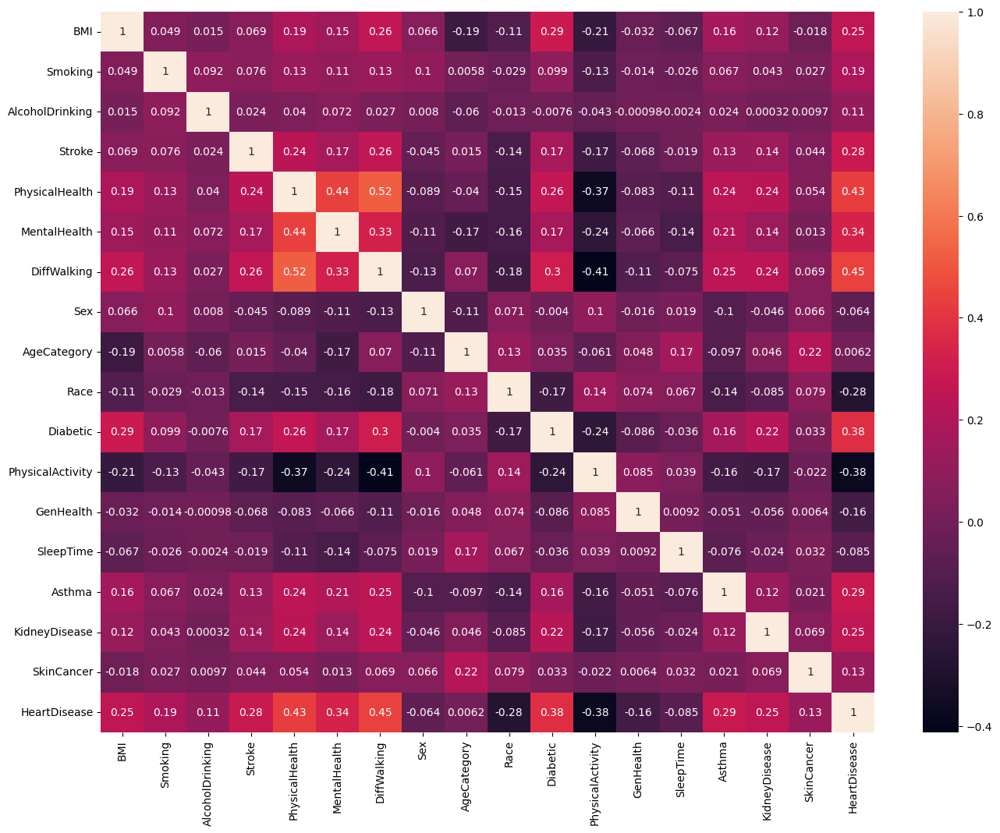

In [130]:
plt.figure(figsize=(16,12))
sns.heatmap(df4.corr(),annot=True)

In [131]:
mask=np.zeros_like(df4.corr())
triangle_indices=np.tril_indices_from(mask)
mask[triangle_indices]=True
mask

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 1., 1

<AxesSubplot:>

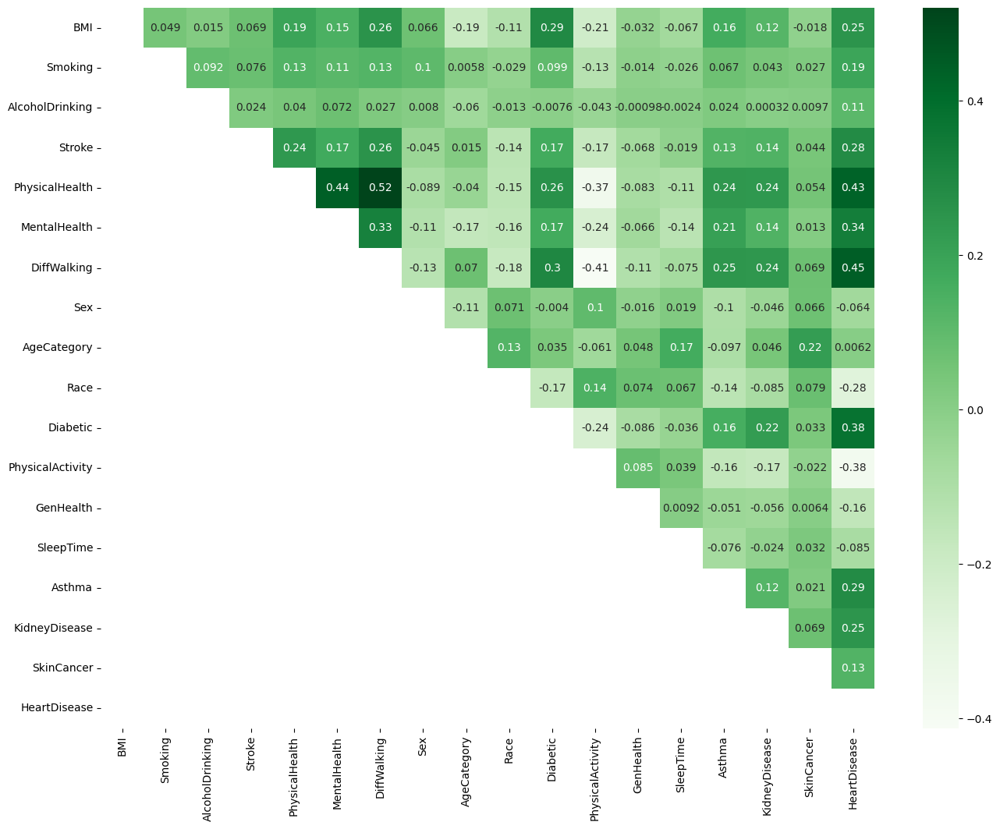

In [132]:
plt.figure(figsize=(16,12))
sns.heatmap(df4.corr(),annot=True,cmap='Greens',mask=mask)

# Split Dataset into Train and Test

In [133]:
from sklearn.model_selection import train_test_split 

In [134]:
xtrain,xtest,ytrain,ytest=train_test_split(new_x,new_y,train_size=0.75,random_state=42)

In [135]:
from sklearn.tree import DecisionTreeClassifier
import xgboost 
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC 
from sklearn.ensemble import RandomForestClassifier

In [136]:
clf=DecisionTreeClassifier()
xgb = XGBClassifier()
ada=AdaBoostClassifier()
neigh=KNeighborsClassifier(n_neighbors= 50)
log=LogisticRegression()
svm = SVC(kernel='linear')
rt = RandomForestClassifier()

In [137]:
def model(xtrain,ytrain,xtest,ytest):
    model_name=['LogisticRegression','KNNClaccification','AdaBoostClassifier','DecisionTreeClassifier','XGBClassifier','SVM','RandomForestClassifier']
    accuracy=[]
    train_accuracy=[]

    #LogisticRegression
    log.fit(xtrain,ytrain)
    accuracy.append(log.score(xtest,ytest))
    train_accuracy.append(log.score(xtrain,ytrain))

    
    #KNNClassification
    neigh.fit(xtrain,ytrain)
    accuracy.append(neigh.score(xtest,ytest))
    train_accuracy.append(neigh.score(xtrain,ytrain))

    
    #AdaBoostClassification
    ada.fit(xtrain,ytrain)
    accuracy.append(ada.score(xtest,ytest))
    train_accuracy.append(ada.score(xtrain,ytrain))

    
    #DecisionTreeClassifier
    clf.fit(xtrain,ytrain)
    accuracy.append(clf.score(xtest,ytest))
    train_accuracy.append(clf.score(xtrain,ytrain))

    
    #XGBClassifier
    xgb.fit(xtrain,ytrain)
    accuracy.append(clf.score(xtest,ytest))
    train_accuracy.append(xgb.score(xtrain,ytrain))
    
    #SVM
    svm.fit(xtrain, ytrain)
    accuracy.append(svm.score(xtest,ytest))
    train_accuracy.append(svm.score(xtrain,ytrain))
    
    #DecisionTreeClassifier
    rt.fit(xtrain, ytrain)
    accuracy.append(rt.score(xtest,ytest))
    train_accuracy.append(rt.score(xtrain,ytrain))
    
  
    return model_name,accuracy,train_accuracy

In [138]:
model_name,test,train=model(xtrain,ytrain,xtest,ytest)

In [139]:
def dataframe(y):
    vis={'Algorithm':['LogisticRegression','KNNClaccification','AdaBoostClassifier','DecisionTreeClassifier','XGBClassifier','SVM','RandomForestClassifier'],
     'Accuracy':y
     
    } 
    accuracy=pd.DataFrame(vis)
    return accuracy

In [140]:
data=dataframe(test)

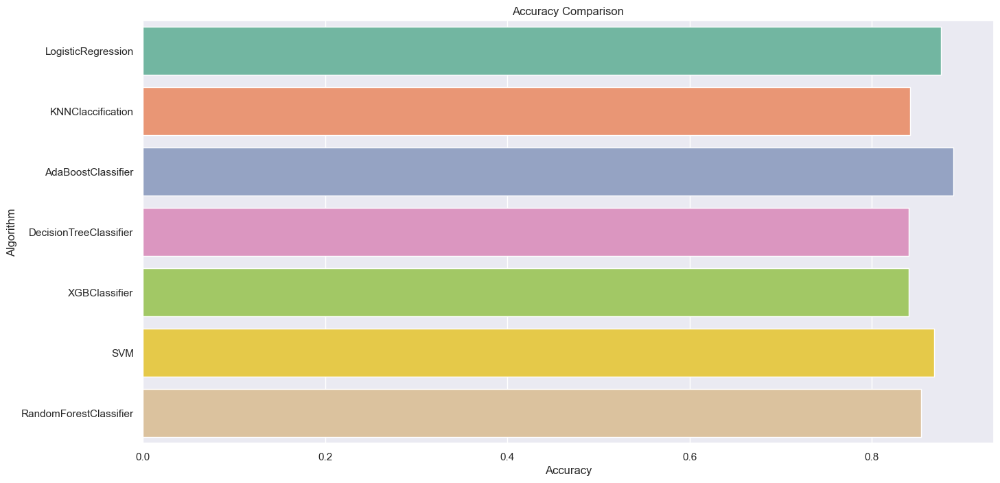

In [141]:
plt.figure(figsize=(16,8))
sns.set()
plt.title('Accuracy Comparison')
sns.barplot(y="Algorithm",x='Accuracy',data=data,palette='Set2')
sns.set(rc={'figure.figsize':(15,5)})

In [142]:
data2=dataframe(train)

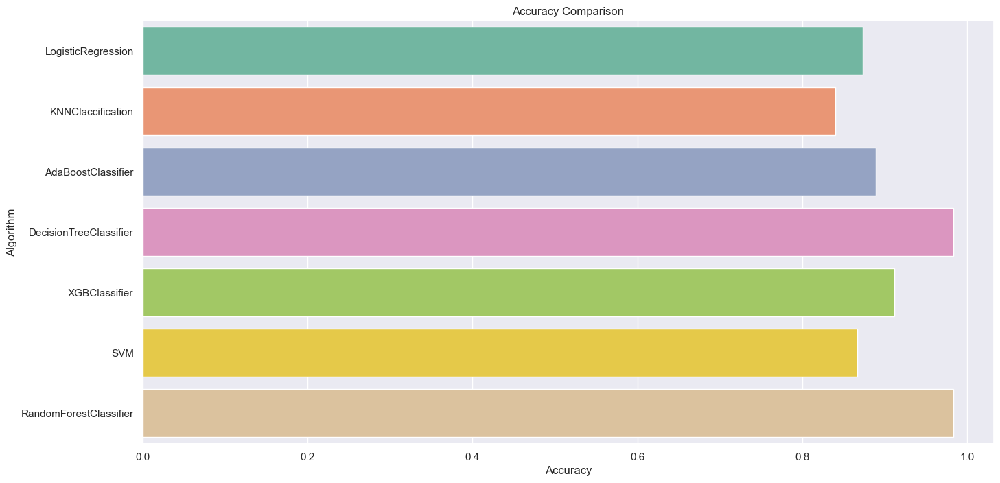

In [143]:
plt.figure(figsize=(16,8))
sns.set()
plt.title('Accuracy Comparison')
sns.barplot(y="Algorithm",x='Accuracy',data=data2,palette='Set2')
sns.set(rc={'figure.figsize':(15,5)})

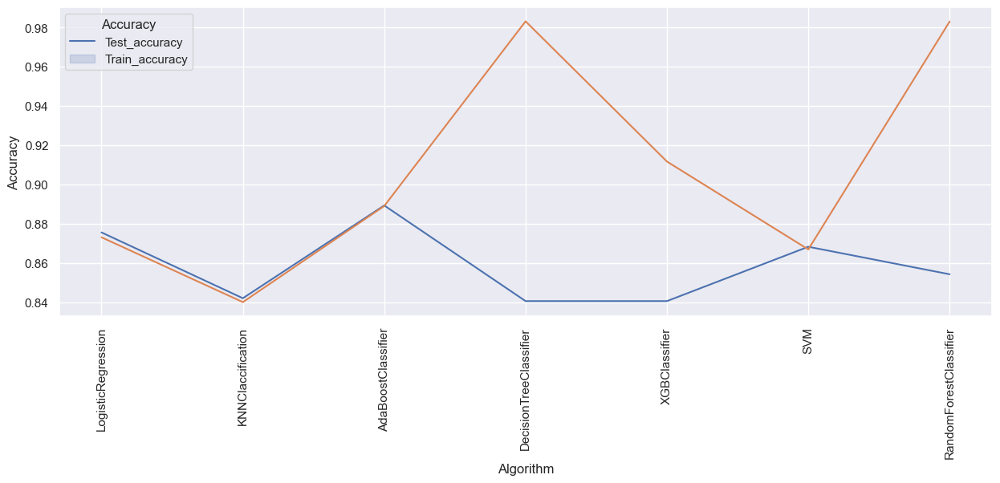

In [144]:
sns.lineplot(data=data, x="Algorithm", y="Accuracy")
sns.lineplot(data=data2, x="Algorithm", y="Accuracy")
plt.ylabel("Accuracy")
plt.xticks(rotation='vertical')
plt.legend(labels=["Test_accuracy","Train_accuracy"], title = "Accuracy")
plt.show()

In [145]:
from sklearn.metrics import classification_report, accuracy_score,confusion_matrix,roc_curve

In [147]:
pred_log=log.predict(xtest)
pred_dclf=clf.predict(xtest)
pred_xgb=xgb.predict(xtest)
pred_ada=ada.predict(xtest)
pred_neigh=neigh.predict(xtest)
pred_svm=svm.predict(xtest)
pred_rfc=rt.predict(xtest)

In [148]:
print("Report of Logistic Regression:\n\n",classification_report(ytest, pred_log))
print("Report of XGboost Classification:\n\n",classification_report(ytest, pred_xgb))
print("Report of Adaboost Classificaiton:\n\n",classification_report(ytest, pred_ada))
print("Report of Knearest Neighbour Classificaiton:\n\n",classification_report(ytest, pred_neigh))
print("Report of Support Vector Machine Classification:\n\n",classification_report(ytest, pred_svm))
print("Report of Random Forest Classification:\n\n",classification_report(ytest, pred_rfc))
print("Report of Decision Tree:\n\n",classification_report(ytest, pred_dclf))

Report of Logistic Regression:

               precision    recall  f1-score   support

           0       0.83      0.94      0.88      6825
           1       0.93      0.81      0.87      6862

    accuracy                           0.88     13687
   macro avg       0.88      0.88      0.88     13687
weighted avg       0.88      0.88      0.87     13687

Report of XGboost Classification:

               precision    recall  f1-score   support

           0       0.86      0.94      0.90      6825
           1       0.94      0.85      0.89      6862

    accuracy                           0.90     13687
   macro avg       0.90      0.90      0.90     13687
weighted avg       0.90      0.90      0.90     13687

Report of Adaboost Classificaiton:

               precision    recall  f1-score   support

           0       0.86      0.93      0.89      6825
           1       0.92      0.85      0.88      6862

    accuracy                           0.89     13687
   macro avg       0.8

# Confusion Matrix

In [149]:
cm_log=confusion_matrix(ytest,pred_log)
cm_dclf=confusion_matrix(ytest,pred_dclf)
cm_xgb=confusion_matrix(ytest,pred_xgb)
cm_ada=confusion_matrix(ytest,pred_ada)
cm_neigh=confusion_matrix(ytest,pred_neigh)
cm_svm=confusion_matrix(ytest,pred_svm)
cm_rfc=confusion_matrix(ytest,pred_rfc)

In [150]:
label_con=['True','False']

In [151]:
conf_mat=[cm_log,cm_dclf,cm_xgb,cm_ada,cm_neigh,cm_svm,cm_rfc]

In [152]:
len(conf_mat)

7

In [153]:
algo=['Logistic Regression','Decision Tree Classification','XGboost Classification','Adaboost Classificaiton','Knearest Neighbour Classificaiton','Support Vector Machine Classification','Random Forest Classification']

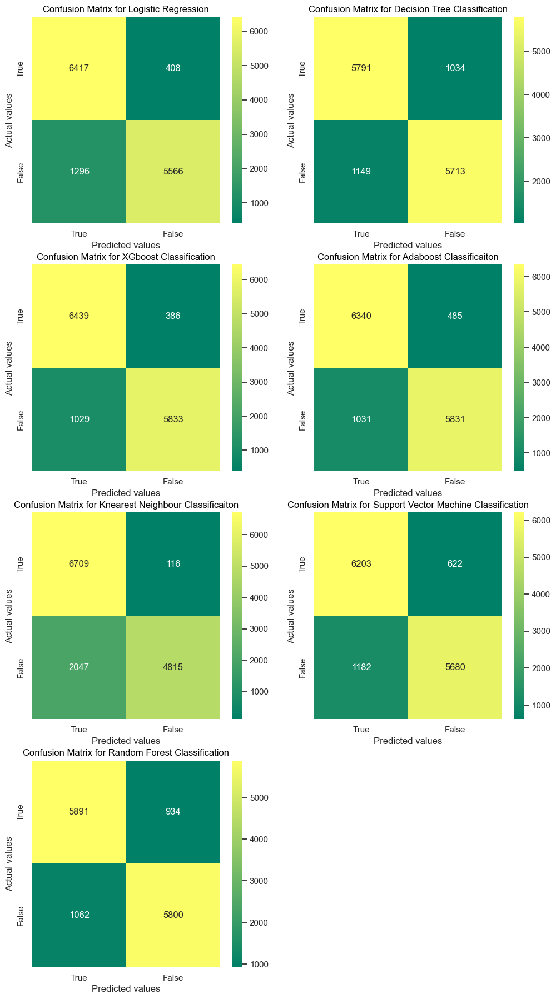

In [154]:
plt.figure(figsize=(12,28))
for i in range(1,8):

    plt.subplot(5,2,i)
    sns.heatmap(conf_mat[i-1],cmap='summer',annot=True,fmt='d',xticklabels=label_con,yticklabels=label_con)
    plt.xlabel('Predicted values')
    plt.ylabel('Actual values')
    plt.title(f'Confusion Matrix for {algo[i-1]}',color='black')

# ROC Curve

In [155]:
from sklearn.metrics import plot_roc_curve

In [157]:
list=[clf,xgb,ada,neigh,log,svm,rt]
type(list[0])

sklearn.tree._classes.DecisionTreeClassifier

<Figure size 1200x2800 with 0 Axes>

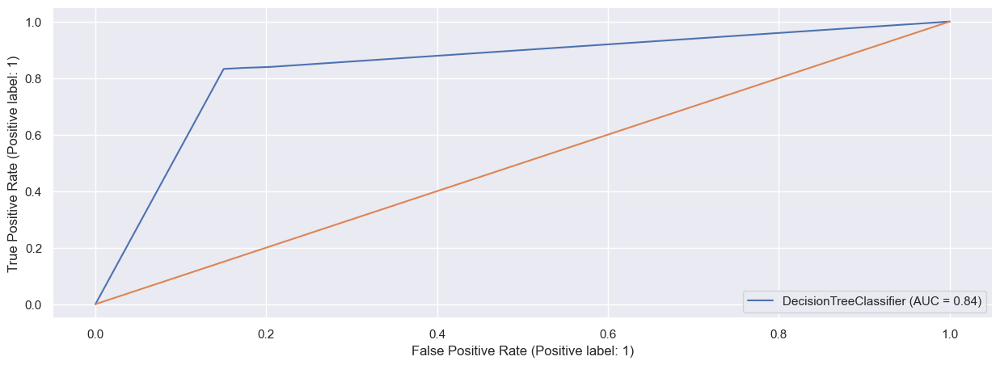

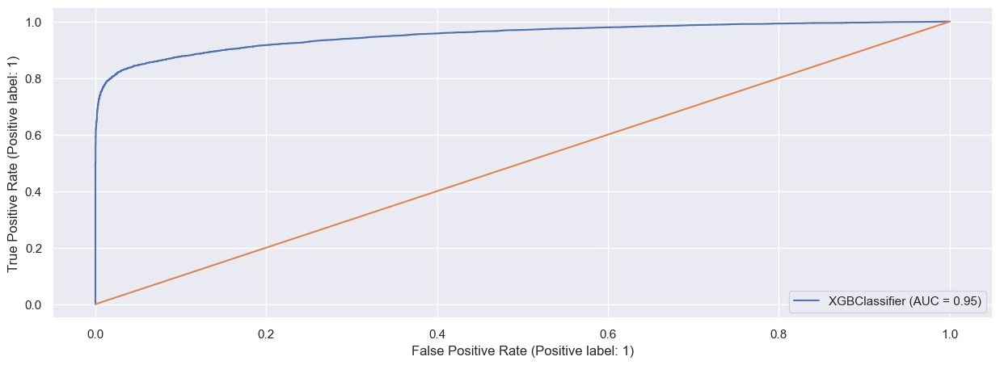

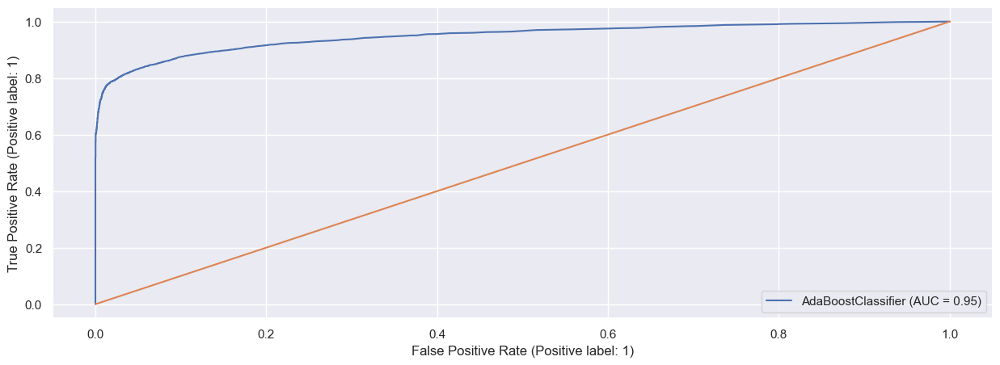

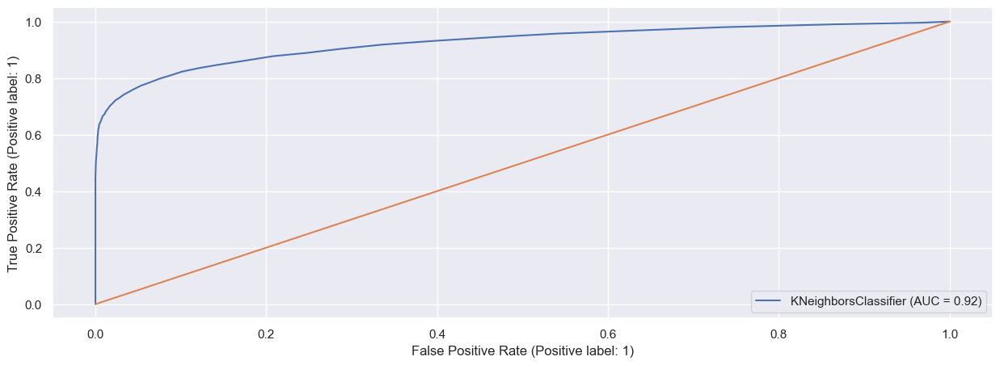

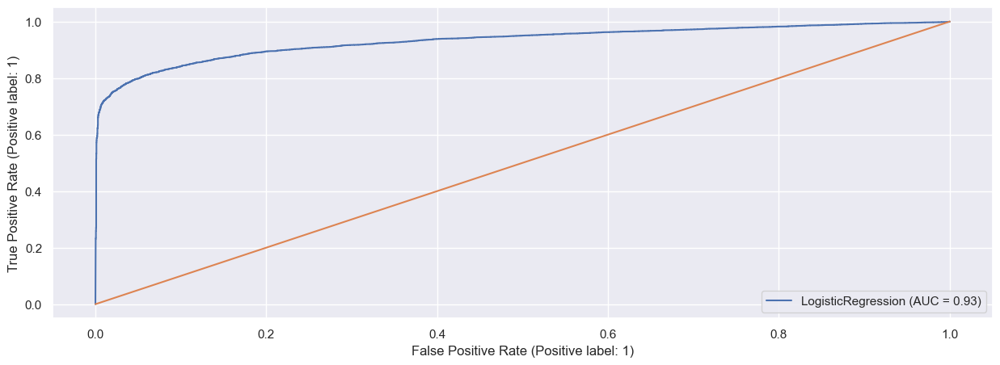

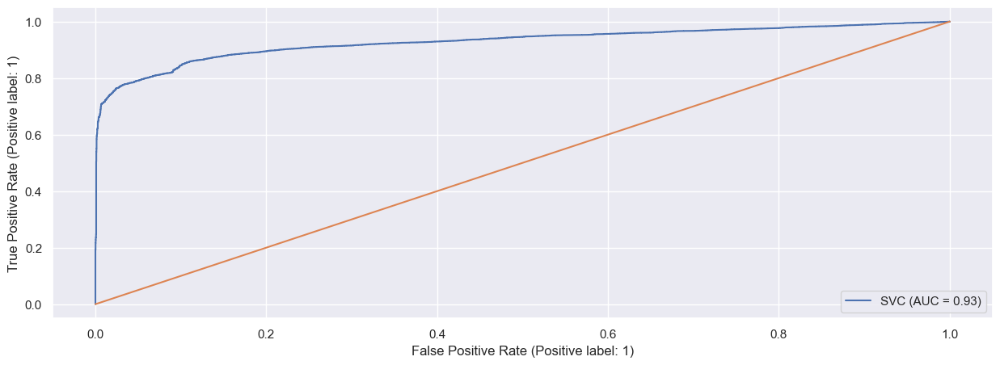

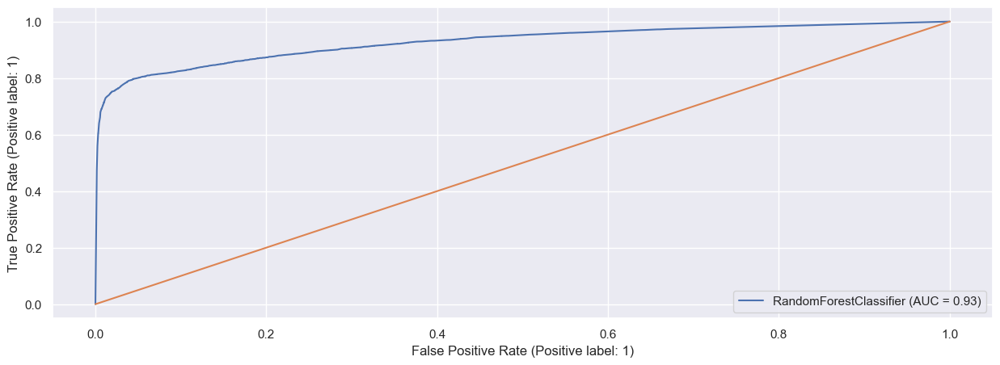

In [158]:
plt.figure(figsize=(12,28))
for i in range(1,8):
    plot_roc_curve(list[i-1], xtest, ytest)
    plt.plot([0,1],[0,1])